### This script calculates precision-recall metrics in a format shared with our method for easier comparison


In [2]:
import pandas as pd
import random
import os
#import utils
import numpy as np
import json
import time

os.chdir('..')
os.getcwd()

'C:\\Users\\evanj\\Documents\\2025-Dinh-Lab-Research-Project\\Fluoro-forest-main\\Fluoro-forest-main'

### Model Training

The cell_phenotyping module includes a Trainer class, which is designed to handle the model training process. This class comes with various configurable attributes that can be set when instantiating the class, such as the number of classes, number of features, learning rate, batch size, and the number of epochs to train the model. The **fit** method is used to train the model using the training and validation datasets and saves the best model based on the lowest validation loss. 

In [3]:
import utils
from maps.cell_phenotyping import Predictor

ModuleNotFoundError: No module named 'utils'

In [3]:
def calculate_metrics(y_true, y_pred, class_names=None):
    """
    Calculates per-class and overall classification metrics and returns them in a pandas DataFrame.

    Args:
        y_true (list or np.array): The ground truth labels.
        y_pred (list or np.array): The predicted labels.
        class_names (list, optional): A list of class names where the index
                                     corresponds to the numerical label. Defaults to None.

    Returns:
        pd.DataFrame: A DataFrame containing per-class and overall metrics.
    """
    # Ensure inputs are numpy arrays for easier indexing and boolean operations
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)

    # Get a list of all unique classes from both true and predicted labels
    classes = np.unique(np.concatenate((y_true, y_pred)))
    
    # Initialize dictionaries to store results
    per_class_metrics = {}
    
    # Iterate through each unique class to calculate individual metrics
    for c in classes:
        # Create boolean masks for the current class
        is_class = y_true == c
        is_predicted_class = y_pred == c
        
        # Calculate True Positives (TP), False Positives (FP), False Negatives (FN)
        tp = np.sum(is_class & is_predicted_class)
        fp = np.sum(~is_class & is_predicted_class)
        fn = np.sum(is_class & ~is_predicted_class)
        
        # True Negatives (TN) are instances that are NOT the current class
        # and are also NOT predicted as the current class.
        tn = np.sum(~is_class & ~is_predicted_class)

        # Handle division by zero for precision and recall
        precision = tp / (tp + fp) if (tp + fp) > 0 else 0
        recall = tp / (tp + fn) if (tp + fn) > 0 else 0
        
        # Calculate F1-score, handling division by zero
        f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
        
        # Accuracy for a specific class is the number of correct predictions (TP+TN)
        # over the total number of samples. This is a common but sometimes
        # misleading metric for imbalanced classes.
        accuracy = (tp + tn) / len(y_true) if len(y_true) > 0 else 0
        
        # Store metrics for the current class
        per_class_metrics[c] = {
            'precision': precision,
            'recall': recall,
            'f1-score': f1_score,
            'accuracy': accuracy,
            'support': np.sum(is_class)
        }
    
    # Create the DataFrame from the per-class metrics dictionary
    metrics_df = pd.DataFrame.from_dict(per_class_metrics, orient='index')

    # Calculate overall metrics (macro-average for precision, recall, and f1-score)
    macro_precision = metrics_df['precision'].mean()
    macro_recall = metrics_df['recall'].mean()
    macro_f1_score = metrics_df['f1-score'].mean()
    
    # Calculate overall accuracy
    overall_correct = np.sum(y_true == y_pred)
    overall_accuracy = overall_correct / len(y_true) if len(y_true) > 0 else 0
    
    # Add an overall row to the DataFrame
    metrics_df.loc['overall'] = [macro_precision, macro_recall, macro_f1_score, overall_accuracy, None]

    # If class names are provided, update the index of the DataFrame
    if class_names is not None:
        # Create a mapping from numerical labels to names
        name_map = {label: name for label, name in enumerate(class_names)}
        
        # Map the current index to the new names, keeping 'overall'
        new_index = [name_map.get(i, i) for i in metrics_df.index]
        metrics_df.index = new_index

    return metrics_df

## All models evaluated from our subsampling to build saturation-like plot

In [17]:
resampling_dir = os.path.join(os.getcwd(), 'data', 'resample', 'results')
valid_data_path = './data/cell_phenotyping/valid.csv' # same validation for each

# define class names and color palette for visual results 
class_names = ['B', 'CD4 T', 'CD8 T', 'DC', 'Endothelial', 'Epithelial',
               'Lymphatic', 'M1', 'M2', 'Mast', 'Monocyte', 'NK', 'Neutrophil', 
               'Other', 'Treg', 'Tumor']

# extracting ground truth cell labels for evaluating model performance against ground truth
gt_labels = pd.read_csv(valid_data_path)['cell_label'].to_numpy()

In [5]:
model_results = []
for model in os.listdir(resampling_dir):
    if 'sampled' in model:
        print(model)
        samples_per_class = model.split('_')[1]
        fold = model.split('_')[4]
        trained_model_path = os.path.join(resampling_dir, model, 'best_checkpoint.pt')

        trained_model = Predictor(model_checkpoint_path = trained_model_path,
                          num_features = 50,
                          num_classes = 16, 
                          batch_size = 128)

        pred_labels, pred_probs = trained_model.predict(valid_data_path)
        metrics_report = calculate_metrics(gt_labels, pred_labels, class_names = class_names)
        metrics_report['samples_per_class'] = samples_per_class
        metrics_report['fold'] = fold

        model_results.append(metrics_report) # concatentate when finished

sampled_30_AND_resample_4
Batch 225/225            sampled_30_AND_resample_3
Batch 225/225            sampled_30_AND_resample_2
Batch 225/225            sampled_30_AND_resample_5
Batch 225/225            sampled_200_AND_resample_1
Batch 225/225            sampled_15_AND_resample_1
Batch 225/225            sampled_500_AND_resample_2
Batch 225/225            sampled_50_AND_resample_5
Batch 225/225            sampled_50_AND_resample_2
Batch 225/225            sampled_500_AND_resample_5
Batch 225/225            sampled_50_AND_resample_3
Batch 225/225            sampled_500_AND_resample_4
Batch 225/225            sampled_500_AND_resample_3
Batch 225/225            sampled_50_AND_resample_4
Batch 225/225            sampled_10_AND_resample_1
Batch 225/225            sampled_20_AND_resample_4
Batch 225/225            sampled_20_AND_resample_3
Batch 225/225            sampled_100_AND_resample_3
Batch 225/225            sampled_100_AND_resample_4
Batch 225/225            sampled_100_AND_resample

In [8]:
final_metrics = pd.concat(model_results, axis = 0)

In [9]:
final_metrics = final_metrics.reset_index()
final_metrics = final_metrics.rename(columns={'index': 'class'})
final_metrics['model'] = 'MAPS'

In [ ]:
# final_metrics.to_csv('final_metrics_maps.csv', index = False)

In [20]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.preprocessing import label_binarize
from sklearn.metrics import precision_recall_curve, average_precision_score, PrecisionRecallDisplay
import csv

def average_pr_curve_per_class(gt, pred, pred_probs, class_names):
    # This function is unchanged from the previous example,
    # as it still needs to return the dictionaries for precision and recall.
    # ... (rest of the original plotting code and return statement) ...
    Y_test = label_binarize(gt, classes=[i for i in range(len(class_names))])
    n_classes = Y_test.shape[1]
    y_score = pred_probs
    precision = dict()
    recall = dict()
    average_precision = dict()
    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(Y_test[:, i], y_score[:, i])
        average_precision[i] = average_precision_score(Y_test[:, i], y_score[:, i])
    precision["micro"], recall["micro"], _ = precision_recall_curve(
        Y_test.ravel(), y_score.ravel()
    )
    average_precision["micro"] = average_precision_score(Y_test, y_score, average="micro")
    colors = plt.get_cmap('tab20').colors
    fig, ax = plt.subplots(figsize=(10, 10), dpi=600)
    f_scores = np.linspace(0.2, 0.8, num=4)
    for f_score in f_scores:
        x = np.linspace(0.01, 1)
        y = f_score * x / (2 * x - f_score)
        (l,) = plt.plot(x[y >= 0], y[y >= 0], color="gray", alpha=0.2)
        plt.annotate("f1={0:0.1f}".format(f_score), xy=(0.9, y[45] + 0.02))
    display = PrecisionRecallDisplay(
        recall=recall["micro"],
        precision=precision["micro"],
        average_precision=average_precision["micro"],
    )
    display.plot(ax=ax, name="Micro-average", color="gold")
    for i, color in zip(range(n_classes), colors):
        display = PrecisionRecallDisplay(
            recall=recall[i],
            precision=precision[i],
            average_precision=average_precision[i],
        )
        display.plot(ax=ax, name=f"{class_names[i]}", color=color)
    handles, labels = display.ax_.get_legend_handles_labels()
    handles.extend([l])
    labels.extend(["iso-f1 curves"])
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.legend(handles=handles, labels=labels, loc="lower left")
    ax.set_title("Precision-Recall Curves")
    plt.show()
    return precision, recall, average_precision


def average_pr_curve_wrapper(gt, pred, pred_probs, class_names, metadata=None):
    """
    A wrapper function that plots PR curves and saves all data to a single
    long-format CSV file with a unique name based on metadata.

    Args:
        gt (array-like): Ground truth labels.
        pred (array-like): Predicted labels.
        pred_probs (array-like): Predicted class probabilities.
        class_names (list): List of class names.
        metadata (dict, optional): A dictionary of metadata to include in the filename.
    """
    # 1. Call the original function to get the plot and the data
    precision, recall, _ = average_pr_curve_per_class(gt, pred, pred_probs, class_names)
    
    # 2. Prepare an empty list to store the long-format data
    long_format_data = []

    # 3. Add the micro-average curve data to the list
    for r, p in zip(recall['micro'], precision['micro']):
        data_point = {
            'curve_type': 'micro_average',
            'precision': p,
            'recall': r
        }
        if metadata:
            data_point.update(metadata)
        long_format_data.append(data_point)

    # 4. Add the per-class curve data to the list
    for i, class_name in enumerate(class_names):
        for r, p in zip(recall[i], precision[i]):
            data_point = {
                'curve_type': 'per_class',
                'class_name': class_name,
                'precision': p,
                'recall': r
            }
            if metadata:
                data_point.update(metadata)
            long_format_data.append(data_point)

    # 5. Create a DataFrame and save it to a single CSV file
    df = pd.DataFrame(long_format_data)
    
    filename_prefix = ""
    if metadata:
        metadata_str = "_".join(f"{k}_{v}" for k, v in metadata.items())
        filename_prefix = f"{metadata_str}_"

    output_filename = f'{filename_prefix}pr_curve_data.csv'
    df.to_csv(output_filename, index=False)
    
    print(f"Precision-Recall curves plotted and all data saved to '{output_filename}'.")

sampled_30_AND_resample_4
Batch 225/225            

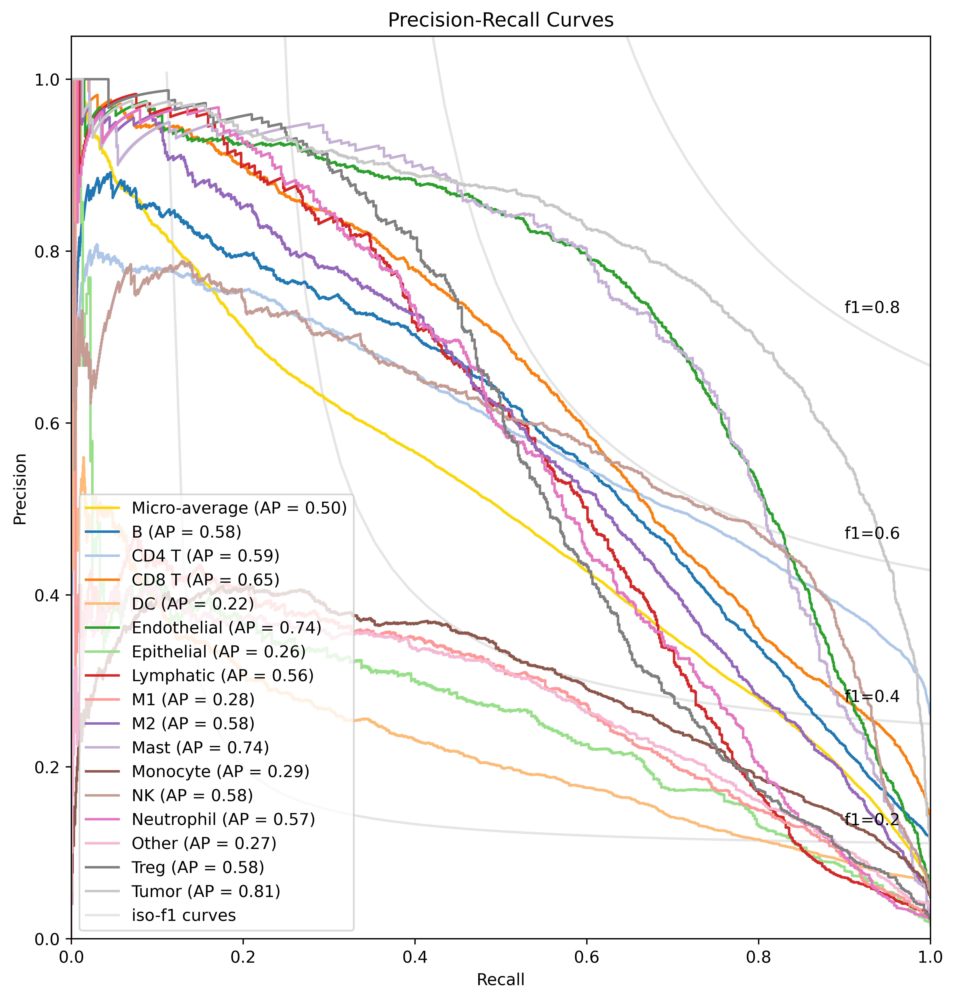

Precision-Recall curves plotted and all data saved to 'samples_per_class_30_fold_4_pr_curve_data.csv'.
sampled_30_AND_resample_3
Batch 225/225            

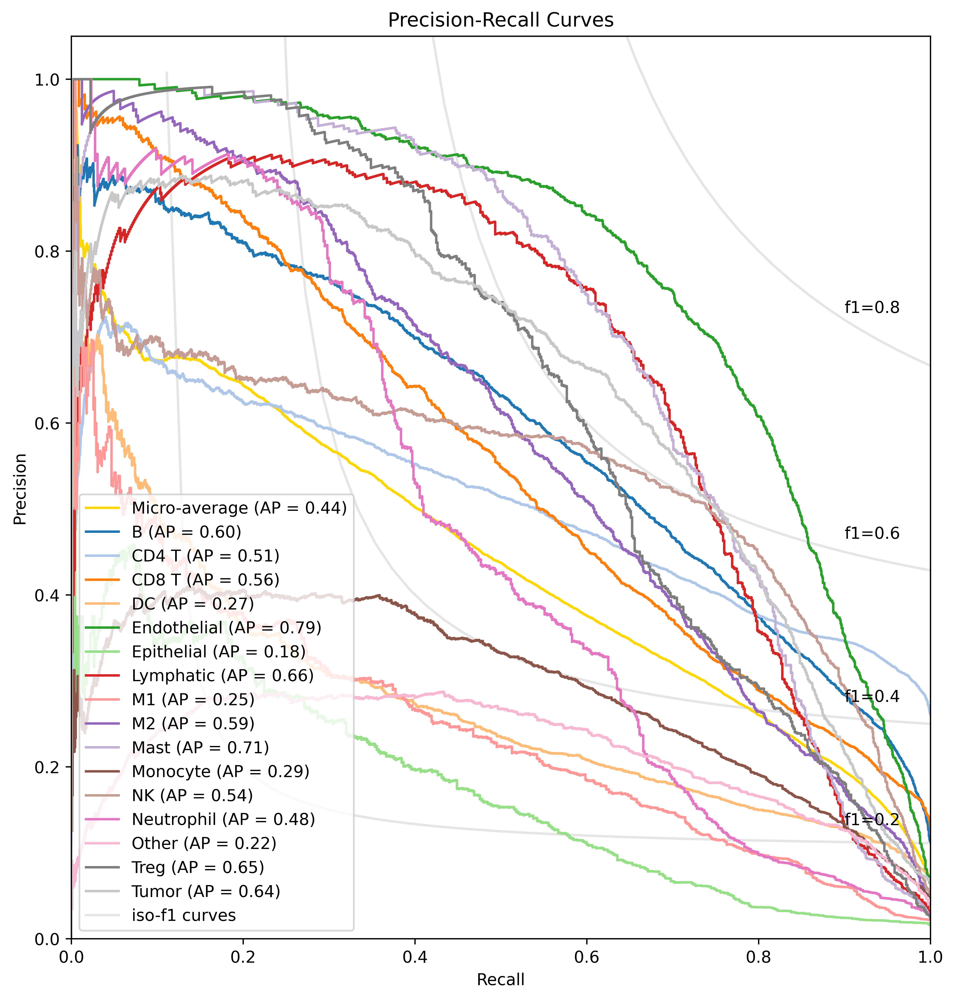

Precision-Recall curves plotted and all data saved to 'samples_per_class_30_fold_3_pr_curve_data.csv'.
sampled_30_AND_resample_2
Batch 225/225            

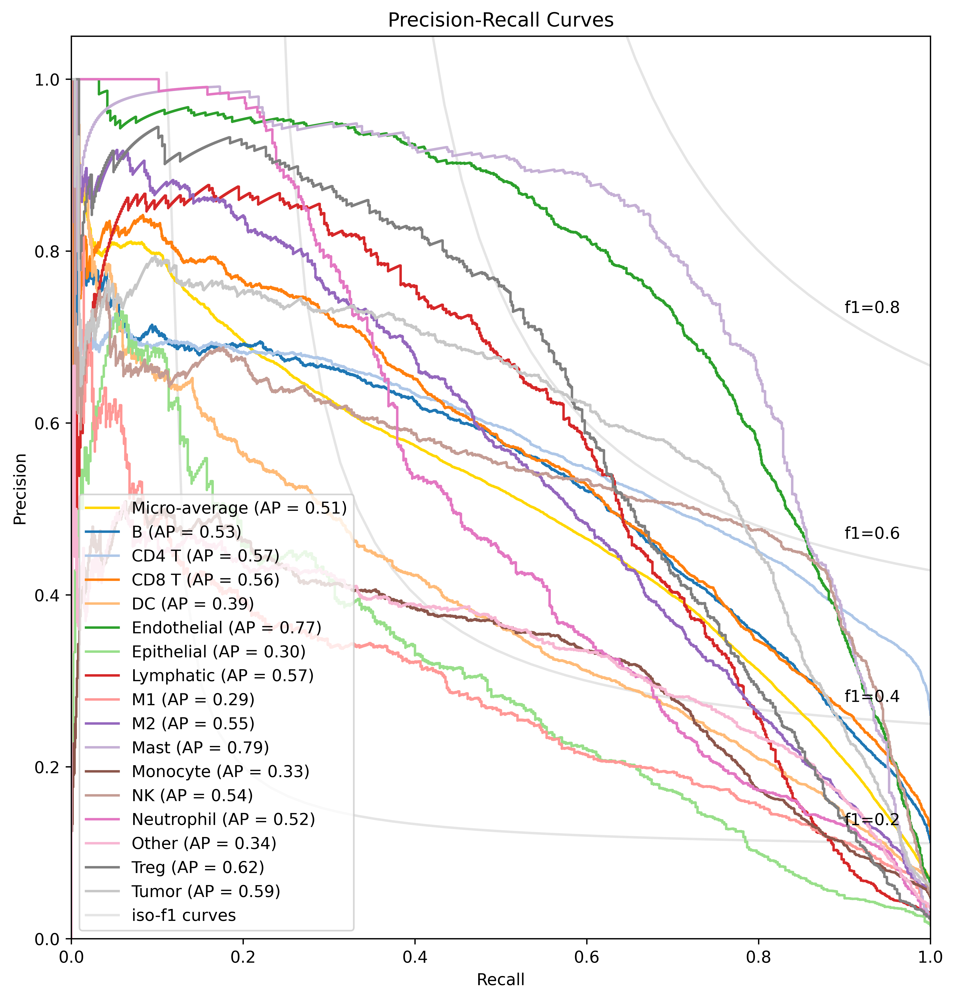

Precision-Recall curves plotted and all data saved to 'samples_per_class_30_fold_2_pr_curve_data.csv'.
sampled_30_AND_resample_5
Batch 225/225            

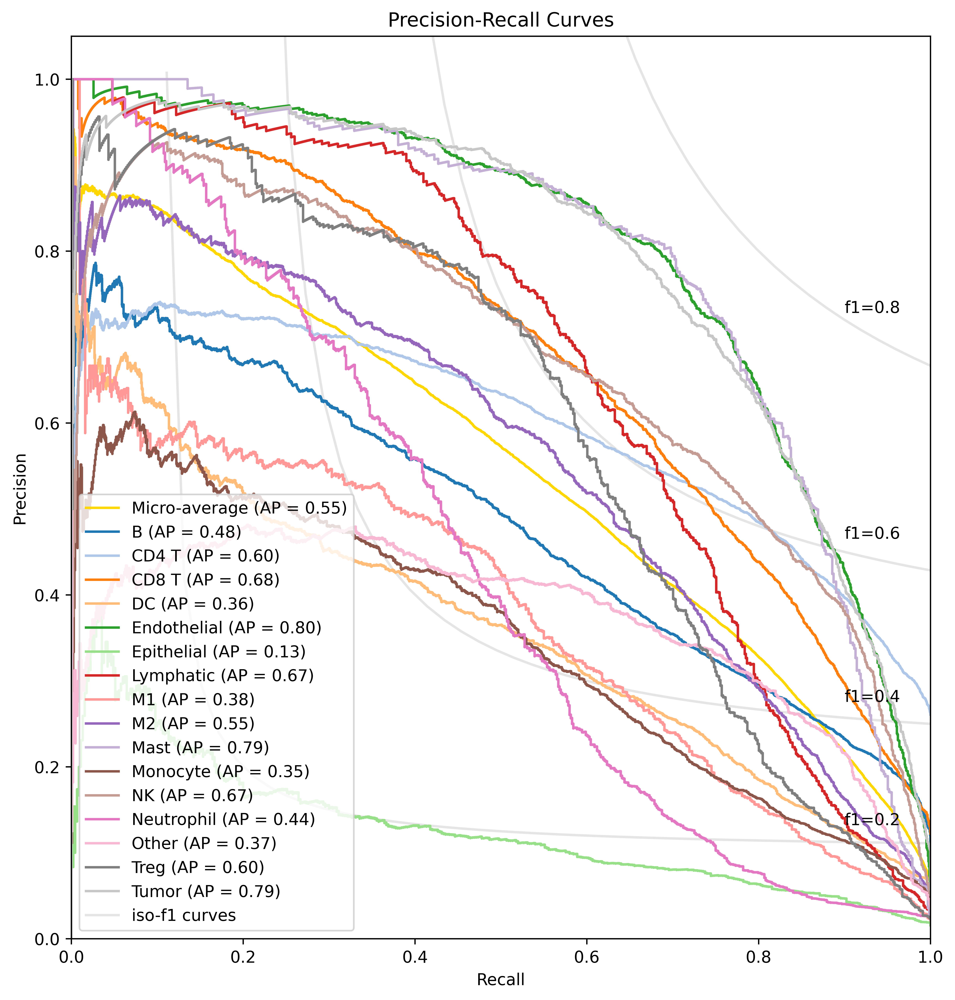

Precision-Recall curves plotted and all data saved to 'samples_per_class_30_fold_5_pr_curve_data.csv'.
sampled_30_AND_resample_1
Batch 225/225            

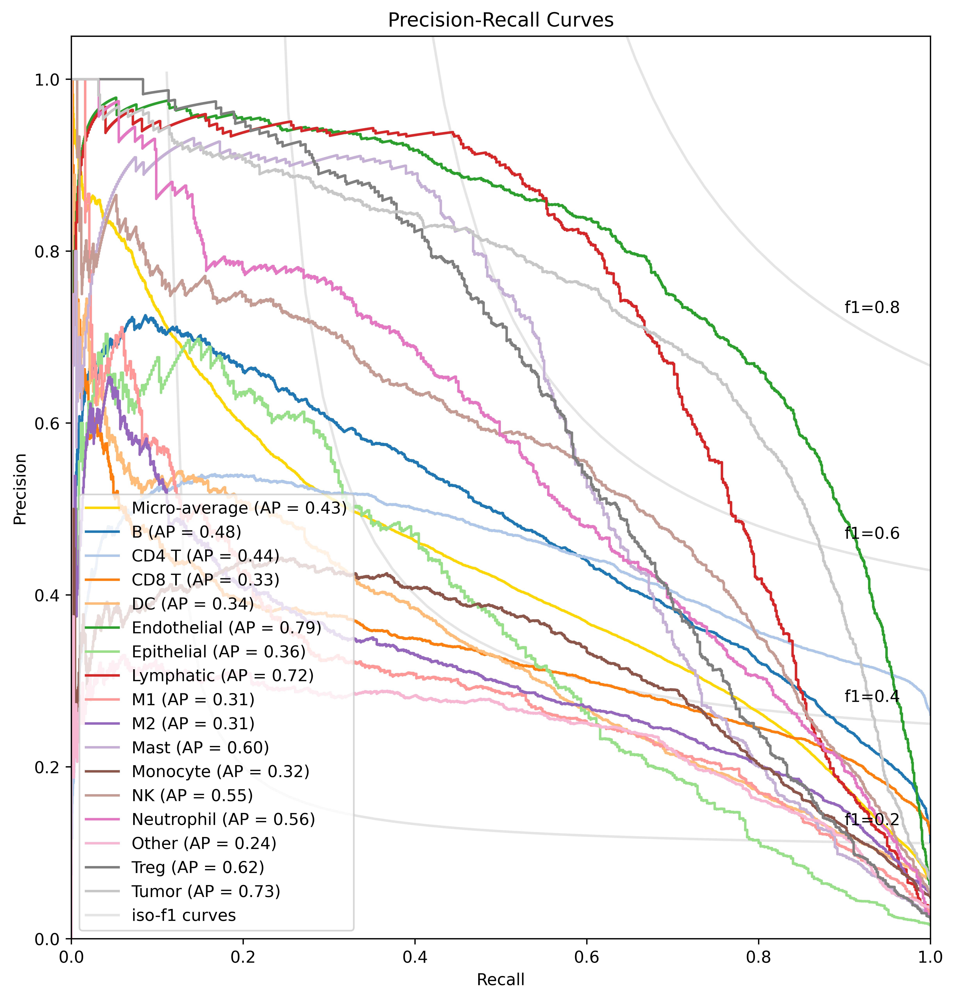

Precision-Recall curves plotted and all data saved to 'samples_per_class_30_fold_1_pr_curve_data.csv'.


In [22]:
for model in os.listdir(resampling_dir):
    if 'sampled_30' in model:
        print(model)
        
        # Extract metadata from the model name
        samples_per_class = model.split('_')[1]
        fold = model.split('_')[4]
        
        # Create a dictionary of the metadata to pass to the wrapper
        metadata = {
            'samples_per_class': samples_per_class,
            'fold': fold
        }

        trained_model_path = os.path.join(resampling_dir, model, 'best_checkpoint.pt')

        trained_model = Predictor(model_checkpoint_path = trained_model_path,
                                  num_features = 50,
                                  num_classes = 16, 
                                  batch_size = 128)

        pred_labels, pred_probs = trained_model.predict(valid_data_path)

        # Call the updated wrapper with the metadata
        average_pr_curve_wrapper(
            gt=gt_labels,
            pred=pred_labels,
            pred_probs=pred_probs,
            class_names=class_names,
            metadata=metadata
        )